 <h1 style="text-align:center;">Rain in Australia</h1>


Database ini memiliki 23 atribut. Dengan data hujan harian selama 10 tahun di Australia,
kolom RainTomorrow adalah target variable yang mau kita prediksi. Jika “Yes” maka
besok harinya disana hujan 1mm atau lebih.
Attribute Information:
1. Date - tanggal hari itu
2. Location - lokasi, nama kota di Australia
3. MinTemp - temperatur terendah hari itu dalam celcius
4. MaxTemp - temperatur tertinggi hari itu dalam celcius
5. Rainfall - jumlah curah hujan hari itu dalam mm
6. Evaporation - jumlah evaporasi dalam mm dari Class A pan selama 24 jam
sebelum jam 9 pagi hari itu
7. Sunshine - jumlah jam hari itu cerah dengan cahaya matahari
8. WindGustDir - arah kecepatan angin yang paling tinggi selama 24 jam sebelum
jam 12 malam hari itu
9. WindGustSpeed - kecepatan angin yang paling tinggi dalam km/jam selama 24
jam sebelum jam 12 malam hari itu
10. WindDir9am - arah angin jam 9 pagi
11. WindDir3pm - arah angin jam 3 sore
12. WindSpeed9am - kecepatan angin jam 9 pagi dalam km/jam dihitung dari
rata-rata kecepatan angin 10 menit sebelum jam 3 sore
13. WindSpeed3pm - kecepatan angin jam 3 sore dalam km/jam dihitung dari
rata-rata kecepatan angin 10 menit sebelum jam 3 sore
14. Humidity9am - humiditas jam 9 pagi dalam persen
15. Humidity3pm - humiditas jam 3 sore dalam persen
16. Pressure9am - tekanan udara jam 9 pagi dalam hpa
17. Pressure3pm - tekanan udara jam 3 sore dalam hpa
18. Cloud9am - persentase langit yang tertutup awan jam 9 pagi. dihitung dalam
oktas, unit ⅛, menghitung berapa unit ⅛ dari langit yang tertutup awan. Jika 0,
langit cerah, jika 8, langit sepenuhnya tertutup awan.
19. Cloud3pm - persentase langit yang tertutup awan jam 3 sore
20. Temp9am - temperatur jam 9 pagi dalam celcius
21. Temp3pm - temperatur jam 3 sore dalam celcius
22. RainToday - apakah hari ini hujan: jika curah hujan 24 jam sebelum jam 9 pagi
melebihi 1mm, maka nilai ini adalah 1, jika tidak nilai nya 0
23. RainTomorrow - variable yang mau di prediksi

## Impor pustaka-pustaka dasar

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Impor fungsi-fungsi dari scikit-learn (sklearn)
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import make_scorer, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [3]:
df = pd.read_csv('weatherAUS.csv')

In [4]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [5]:
# Melihat tipe data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

## Missing Values

In [6]:
(df.isnull().sum() / len(df)) * 100

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

<Axes: >

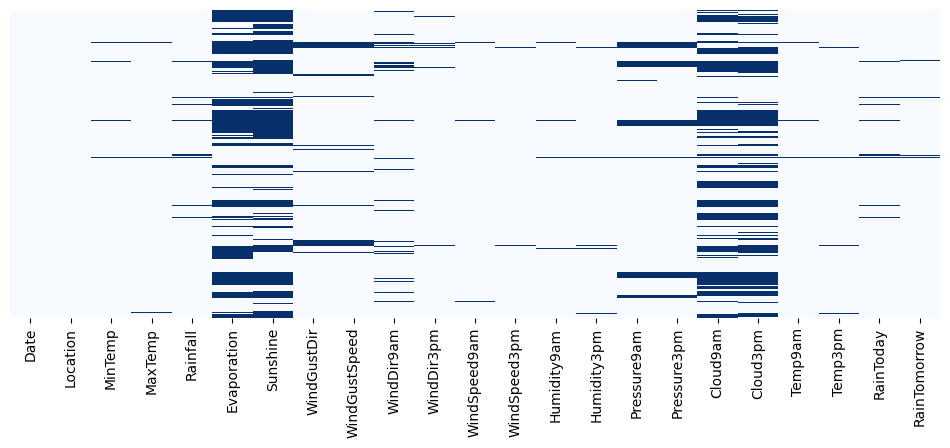

In [7]:
fig,ax = plt.subplots(1,1,figsize=(12,4))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='Blues', ax=ax)

Dikarenakan ada banyak nya data yang bernilai null dari dataset yang mungkin dapat mengakibatkan tidak optimal kinerja machine learning nantinya, maka diperlukan analisa untuk tindakan yang akan dilakukan terhadap data null.

## Menghapus nilai null pada RainToday, RainTomorrow, Sunshine, Evaporation

In [8]:
df.dropna(subset=['RainTomorrow'], inplace=True)
df.dropna(subset=['RainToday'], inplace=True)
df.dropna(subset=['Sunshine'], inplace=True)
df.dropna(subset=['Evaporation'], inplace=True)

In [9]:
df.isnull().sum()

Date                0
Location            0
MinTemp            57
MaxTemp            29
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir      4204
WindGustSpeed    4181
WindDir9am       2512
WindDir3pm        636
WindSpeed9am      139
WindSpeed3pm      354
Humidity9am       357
Humidity3pm       534
Pressure9am       106
Pressure3pm       112
Cloud9am         6163
Cloud3pm         7679
Temp9am            97
Temp3pm           292
RainToday           0
RainTomorrow        0
dtype: int64

RainToday
No     54435
Yes    15765
Name: count, dtype: int64
RainTomorrow
No     54429
Yes    15771
Name: count, dtype: int64


<Axes: xlabel='RainTomorrow', ylabel='count'>

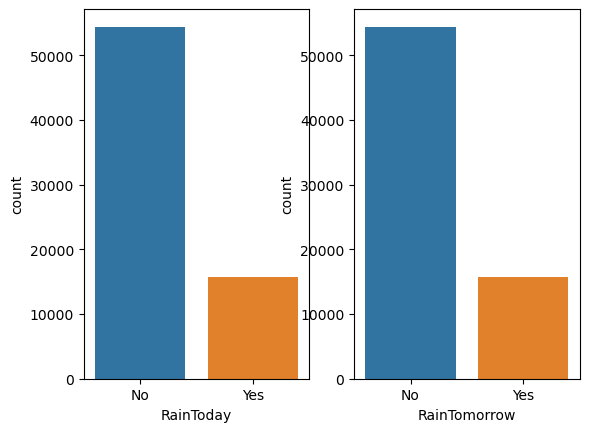

<Figure size 2000x3000 with 0 Axes>

In [10]:
fig, ax =plt.subplots(1,2)
print(df.RainToday.value_counts())
print(df.RainTomorrow.value_counts())

plt.figure(figsize=(20,30))
sns.countplot(data=df,x='RainToday',ax=ax[0])
sns.countplot(data=df,x='RainTomorrow',ax=ax[1])

## Mengubah tipe data

In [11]:
# Mengubah tipe data menjadi timeseries dengan pandas
df['Date'] = pd.to_datetime(df['Date'])

In [12]:
# Mengubah nilai pada dua kolom DataFrame yaitu 'RainToday' dan 'RainTomorrow', dari string 'Yes' dan 'No' menjadi bilangan biner (1 untuk 'Yes' dan 0 untuk 'No')
df['RainTomorrow'] = df['RainTomorrow'].map({'Yes': 1, 'No': 0})
df['RainToday'] = df['RainToday'].map({'Yes': 1, 'No': 0})

In [13]:
df['RainTomorrow'].value_counts()

RainTomorrow
0    54429
1    15771
Name: count, dtype: int64

### Membuat kolom Month dan Day

In [14]:
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.dayofweek
df['Year'] = df['Date'].dt.year

In [15]:
df['Day'].unique()

array([3, 4, 5, 6, 0, 1, 2], dtype=int32)

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 70200 entries, 6049 to 142302
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           70200 non-null  datetime64[ns]
 1   Location       70200 non-null  object        
 2   MinTemp        70143 non-null  float64       
 3   MaxTemp        70171 non-null  float64       
 4   Rainfall       70200 non-null  float64       
 5   Evaporation    70200 non-null  float64       
 6   Sunshine       70200 non-null  float64       
 7   WindGustDir    65996 non-null  object        
 8   WindGustSpeed  66019 non-null  float64       
 9   WindDir9am     67688 non-null  object        
 10  WindDir3pm     69564 non-null  object        
 11  WindSpeed9am   70061 non-null  float64       
 12  WindSpeed3pm   69846 non-null  float64       
 13  Humidity9am    69843 non-null  float64       
 14  Humidity3pm    69666 non-null  float64       
 15  Pressure9am    70094

## EDA (Exploratory Data Analysis)

## Variability

In [17]:
df.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
count,70200,70143.000000,70171.000000,70200.000000,70200.000000,70200.000000,66019.000000,70061.000000,69846.000000,69843.000000,...,70088.000000,64037.000000,62521.000000,70103.000000,69908.000000,70200.000000,70200.000000,70200.000000,70200.000000,70200.000000
mean,2012-08-29 20:07:14.461538816,12.995573,23.633183,2.085217,5.285397,7.597454,40.575910,14.911120,19.446611,67.122503,...,1015.069549,4.274357,4.345980,17.615380,22.140193,0.224573,0.224658,6.410783,2.937279,2012.171838
min,2007-11-01 00:00:00,-8.000000,4.100000,0.000000,0.000000,0.000000,9.000000,0.000000,0.000000,0.000000,...,977.100000,0.000000,0.000000,-1.200000,3.700000,0.000000,0.000000,1.000000,0.000000,2007.000000
25%,2010-07-22 00:00:00,8.300000,18.200000,0.000000,2.600000,4.800000,31.000000,9.000000,13.000000,56.000000,...,1010.300000,1.000000,2.000000,12.600000,16.900000,0.000000,0.000000,3.000000,1.000000,2010.000000
50%,2012-06-28 00:00:00,12.700000,23.000000,0.000000,4.600000,8.400000,39.000000,13.000000,19.000000,68.000000,...,1015.000000,5.000000,5.000000,17.100000,21.600000,0.000000,0.000000,6.000000,3.000000,2012.000000
75%,2014-09-01 00:00:00,17.700000,28.900000,0.800000,7.200000,10.600000,48.000000,20.000000,24.000000,81.000000,...,1019.800000,7.000000,7.000000,22.500000,27.100000,0.000000,0.000000,9.000000,5.000000,2014.000000
max,2017-06-25 00:00:00,33.900000,48.100000,206.200000,81.200000,14.500000,135.000000,67.000000,76.000000,100.000000,...,1038.900000,9.000000,9.000000,39.400000,46.100000,1.000000,1.000000,12.000000,6.000000,2017.000000
std,NaN,6.329179,6.929052,6.725116,3.668020,3.774658,13.451274,8.648854,8.556187,18.697812,...,7.020620,2.805584,2.651244,6.501817,6.796176,0.417304,0.417360,3.432240,1.998471,2.424025


Dari histogram diatas dapat dilihat MinTemp dari dataset berada di angka -8, dengan frequency yang sedikit. dan frequency terbanyak dari dataset MinTemp berada di angka 8-12 dengan frequency yang lebih dari 16000

In [18]:
numeric_cols = df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine','WindGustSpeed',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm']]

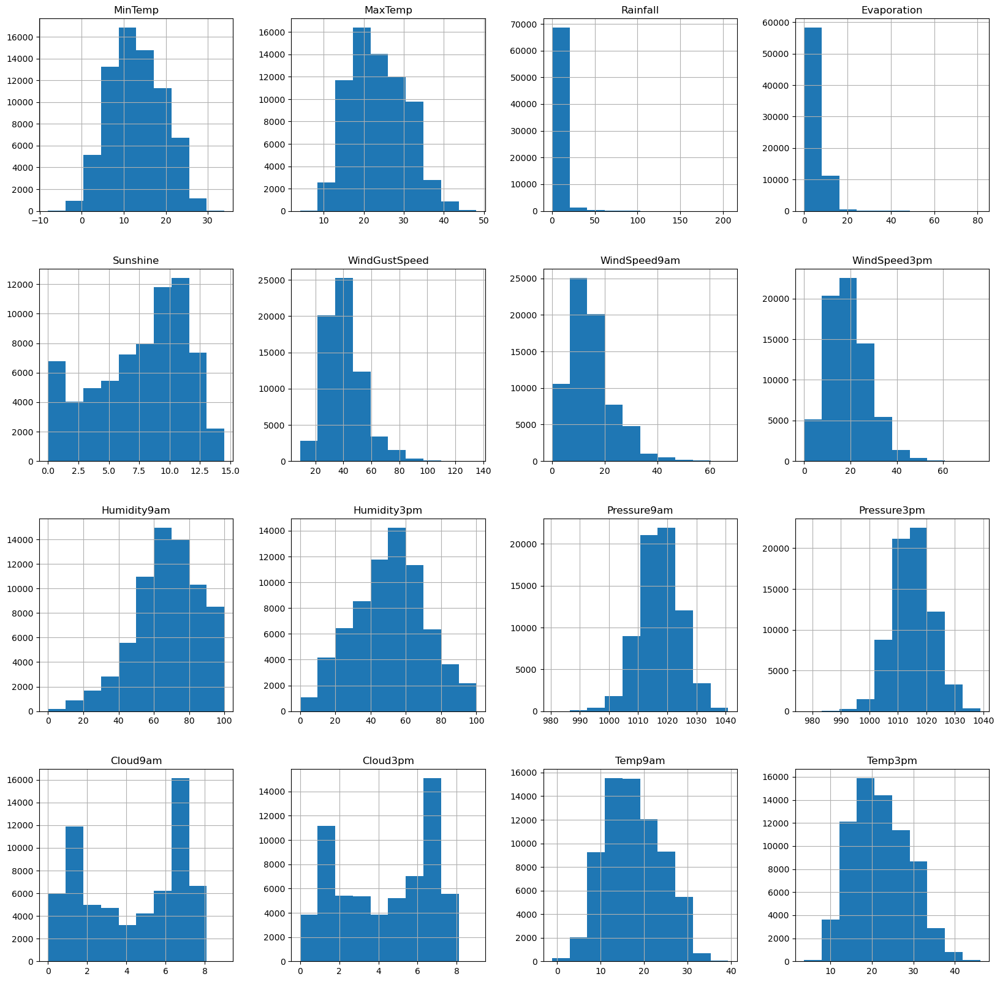

In [19]:
numeric_cols.hist(figsize=(20,20))
plt.show()

Dari histogram diatas kita dapat melihat berbagai variability informasi dari kolom yang berisi numeric

## Range

In [20]:
# Menghitung rentang untuk keseluruhan DataFrame
data_range = numeric_cols.max() - numeric_cols.min()

In [21]:
data_range

MinTemp           41.9
MaxTemp           44.0
Rainfall         206.2
Evaporation       81.2
Sunshine          14.5
WindGustSpeed    126.0
WindSpeed9am      67.0
WindSpeed3pm      76.0
Humidity9am      100.0
Humidity3pm      100.0
Pressure9am       60.4
Pressure3pm       61.8
Cloud9am           9.0
Cloud3pm           9.0
Temp9am           40.6
Temp3pm           42.4
dtype: float64

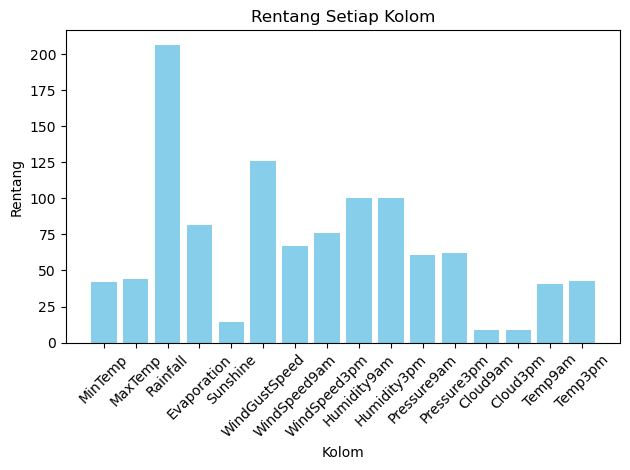

In [22]:
# Plotting bar plot
plt.bar(data_range.index, data_range.values, color='skyblue')
plt.title('Rentang Setiap Kolom')
plt.xlabel('Kolom')
plt.ylabel('Rentang')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Central Tendency

## Box Plot

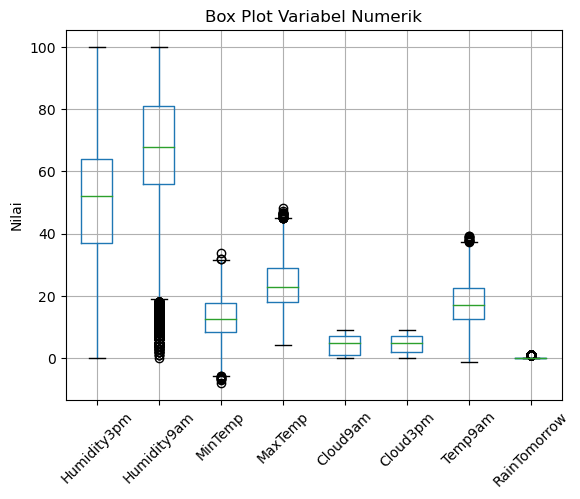

In [23]:
df.boxplot(column=['Humidity3pm', 'Humidity9am', 'MinTemp', 'MaxTemp', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'RainTomorrow'])
plt.title('Box Plot Variabel Numerik')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.show()

In [24]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Hitung central tendency
mean_per_column = df[numeric_cols].mean()
median_per_column = df[numeric_cols].median()
mode_per_column = df[numeric_cols].mode().iloc[0]  # Mode dapat memiliki lebih dari satu nilai

In [25]:
# Hitung central tendency
mean_per_column = df[numeric_cols].mean()
median_per_column = df[numeric_cols].median()
mode_per_column = df[numeric_cols].mode().iloc[0]

### Mean

In [26]:
mean_per_column

MinTemp            12.995573
MaxTemp            23.633183
Rainfall            2.085217
Evaporation         5.285397
Sunshine            7.597454
WindGustSpeed      40.575910
WindSpeed9am       14.911120
WindSpeed3pm       19.446611
Humidity9am        67.122503
Humidity3pm        50.675538
Pressure9am      1017.436755
Pressure3pm      1015.069549
Cloud9am            4.274357
Cloud3pm            4.345980
Temp9am            17.615380
Temp3pm            22.140193
RainToday           0.224573
RainTomorrow        0.224658
dtype: float64

### Median

In [27]:
median_per_column

MinTemp            12.7
MaxTemp            23.0
Rainfall            0.0
Evaporation         4.6
Sunshine            8.4
WindGustSpeed      39.0
WindSpeed9am       13.0
WindSpeed3pm       19.0
Humidity9am        68.0
Humidity3pm        52.0
Pressure9am      1017.4
Pressure3pm      1015.0
Cloud9am            5.0
Cloud3pm            5.0
Temp9am            17.1
Temp3pm            21.6
RainToday           0.0
RainTomorrow        0.0
dtype: float64

## Mode

In [28]:
mode_per_column

MinTemp            13.0
MaxTemp            19.5
Rainfall            0.0
Evaporation         4.0
Sunshine            0.0
WindGustSpeed      35.0
WindSpeed9am       13.0
WindSpeed3pm       17.0
Humidity9am        68.0
Humidity3pm        52.0
Pressure9am      1016.4
Pressure3pm      1015.3
Cloud9am            7.0
Cloud3pm            7.0
Temp9am            17.0
Temp3pm            19.0
RainToday           0.0
RainTomorrow        0.0
Name: 0, dtype: float64

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 70200 entries, 6049 to 142302
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           70200 non-null  datetime64[ns]
 1   Location       70200 non-null  object        
 2   MinTemp        70143 non-null  float64       
 3   MaxTemp        70171 non-null  float64       
 4   Rainfall       70200 non-null  float64       
 5   Evaporation    70200 non-null  float64       
 6   Sunshine       70200 non-null  float64       
 7   WindGustDir    65996 non-null  object        
 8   WindGustSpeed  66019 non-null  float64       
 9   WindDir9am     67688 non-null  object        
 10  WindDir3pm     69564 non-null  object        
 11  WindSpeed9am   70061 non-null  float64       
 12  WindSpeed3pm   69846 non-null  float64       
 13  Humidity9am    69843 non-null  float64       
 14  Humidity3pm    69666 non-null  float64       
 15  Pressure9am    70094

## Data Visualization

## Jumlah Hujan pertahun dari dataset

In [30]:
rain_per_year = df[df['RainToday'] == 1].groupby('Year')['RainToday'].count()

In [31]:
rain_per_year

Year
2007      19
2008     418
2009    2117
2010    2470
2011    2136
2012    1829
2013    1867
2014    1667
2015    1620
2016    1217
2017     405
Name: RainToday, dtype: int64

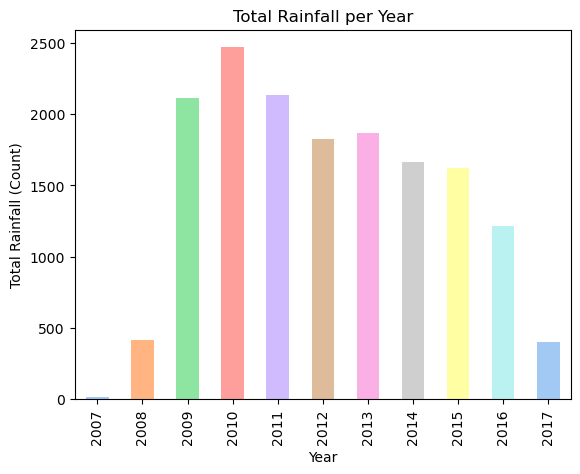

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming rain_per_year is already calculated
rain_per_year.plot(kind='bar', color=sns.color_palette('pastel'))
plt.xlabel('Year')
plt.ylabel('Total Rainfall (Count)')
plt.title('Total Rainfall per Year')
plt.show()


Dari plot diatas dapat dilihat bahwa curah hujan paling tinggi adala tahun 2010

## Identifikasi arah angin jam 9 pagi, jam 3 sore

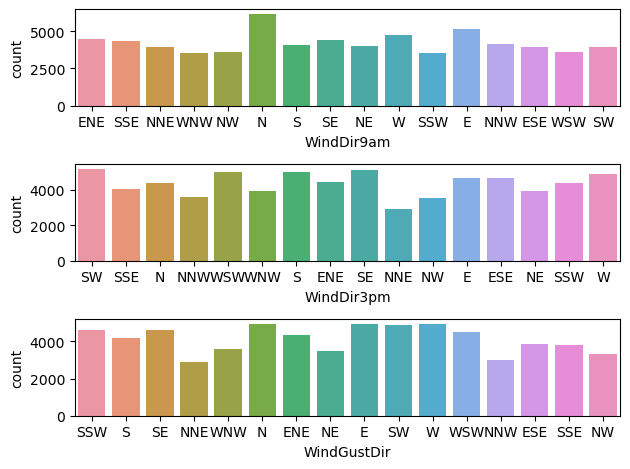

<Figure size 1000x1000 with 0 Axes>

In [33]:
# Mengidentifikasi arah angin jam 9 pagi, jam 3 sore
fig, ax =plt.subplots(3,1)
plt.figure(figsize=(10,10))

sns.countplot(data=df,x='WindDir9am',ax=ax[0])
sns.countplot(data=df,x='WindDir3pm',ax=ax[1])
sns.countplot(data=df,x='WindGustDir',ax=ax[2])
fig.tight_layout()

- Pada pukul 9 pagi hari, arah angin cenderung lebih banyak ke utara
- Pada pukul 3 sore, arah angin cenderung lebih banyakj ke SW, NNW, S, SE, W
- Arah angin selama 24 jam dapat dilihat di plot diatas.

## Tingkat curah hujan berdasarkan lokasi

In [34]:
import plotly.express as px

In [35]:
location = df[df['RainToday'] == 1].sort_values(by=['Location'])

In [36]:
print("Unique locations and their counts :")
location = location["Location"].value_counts()
location = location.reset_index()
location.columns= ["Location", "Counts"]
print(location)

Unique locations and their counts :
            Location  Counts
0           Portland     907
1             Sydney     824
2             Darwin     815
3             Cairns     770
4           Dartmoor     762
5       MountGambier     758
6      NorfolkIsland     757
7             Hobart     752
8      SydneyAirport     738
9           Watsonia     732
10            Albany     728
11          Brisbane     679
12  MelbourneAirport     652
13             Perth     644
14         Melbourne     579
15      PerthAirport     566
16         Nuriootpa     542
17      CoffsHarbour     441
18        WaggaWagga     440
19        Townsville     401
20              Sale     394
21       Williamtown     358
22           Mildura     305
23             Moree     285
24          Canberra     267
25          Adelaide     264
26      AliceSprings     201
27           Woomera     136
28             Cobar      68


In [37]:
fig = px.treemap(location, path=['Location'], values='Counts', color='Counts', title="Tngkat hujan dari yang tertinggi ke terendah")
fig.show()

In [38]:
fig = px.histogram(df, x="Evaporation", title="Evaporation(mm)", color_discrete_sequence=["blue"])
fig.show()

In [39]:
print("Unique wind gust directions and their counts :")
windgustdir = df["WindGustDir"].value_counts()
windgustdir = windgustdir.reset_index()
windgustdir.columns= ["Wind Gust Direction", "Counts"]
print(windgustdir)

Unique wind gust directions and their counts :
   Wind Gust Direction  Counts
0                    N    4960
1                    E    4923
2                    W    4915
3                   SW    4886
4                  SSW    4617
5                   SE    4616
6                  WSW    4491
7                  ENE    4373
8                    S    4164
9                  ESE    3885
10                 SSE    3824
11                 WNW    3609
12                  NE    3508
13                  NW    3343
14                 NNW    2995
15                 NNE    2887


In [40]:
fig = px.bar(windgustdir, x="Wind Gust Direction", y="Counts", title="Arah hembusan angin berdasarkan yang tertinggi hingga terendah", color="Counts")
fig.show()

In [41]:
print("Unique wind gust speed in km/hr and their counts :")
windgustspd = df["WindGustSpeed"].value_counts()
windgustspd = windgustspd.reset_index()
windgustspd.columns= ["Wind Gust Speed", "Counts"]
print(windgustspd)

Unique wind gust speed in km/hr and their counts :
    Wind Gust Speed  Counts
0              35.0    4622
1              39.0    4437
2              31.0    4263
3              37.0    4233
4              33.0    4153
..              ...     ...
57            117.0       2
58            122.0       1
59            135.0       1
60            124.0       1
61            111.0       1

[62 rows x 2 columns]


In [42]:
fig = px.bar(windgustspd, x="Wind Gust Speed", y="Counts", title= "Kecepatan arah angin (Km/Jam) berdasarkan yang tertinggi Ke terendah", color="Counts")
fig.show()

In [43]:
from IPython.core.display import display, HTML
display(HTML("<div class='tableauPlaceholder' id='viz1652712003286' style='position: relative'><noscript><a href='#'><img alt='RainFall Per Location ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='RainFallinLocations&#47;Sheet1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1652712003286');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';var scriptElement = document.createElement('script');scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js'; vizElement.parentNode.insertBefore(scriptElement, vizElement); </script>"))

/var/folders/v5/87yl3yfj69j7yrypnbp8ghzm0000gp/T/ipykernel_1851/832404541.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



In [44]:
loctemp = df.groupby("Location")[["MinTemp", "MaxTemp"]].mean().round()
loctemp = loctemp.reset_index()
loctemp.columns= ["Location","MinTemp", "MaxTemp"]
print(loctemp)

            Location  MinTemp  MaxTemp
0           Adelaide     13.0     23.0
1             Albany     13.0     20.0
2       AliceSprings     13.0     29.0
3           Brisbane     16.0     26.0
4             Cairns     21.0     30.0
5           Canberra      7.0     20.0
6              Cobar     14.0     26.0
7       CoffsHarbour     14.0     24.0
8           Dartmoor      9.0     20.0
9             Darwin     23.0     33.0
10            Hobart      9.0     18.0
11         Melbourne     12.0     21.0
12  MelbourneAirport     10.0     20.0
13           Mildura     11.0     25.0
14             Moree     13.0     27.0
15      MountGambier      9.0     20.0
16     NorfolkIsland     17.0     22.0
17         Nuriootpa      9.0     22.0
18             Perth     13.0     25.0
19      PerthAirport     13.0     26.0
20          Portland     10.0     18.0
21              Sale      9.0     20.0
22            Sydney     15.0     23.0
23     SydneyAirport     15.0     23.0
24        Townsville     

In [45]:
fig = px.bar(loctemp, x="Location", y=["MinTemp", "MaxTemp"], title="Lokasi hujan berdasarkan rata-rata suhu minimum rata-rata dan suhu maksimum")
fig.show()

In [46]:
fig = px.histogram(df, x='Location', title='RainToday', color='RainToday')
fig.show()

In [47]:
fig = px.histogram(df, x='Location', title='Rain Tomorrow', color='RainTomorrow')
fig.show()

## Jumlah rata-rata curah hujan untuk setiap kota di Australia dan frekuensi setiap curah hujan


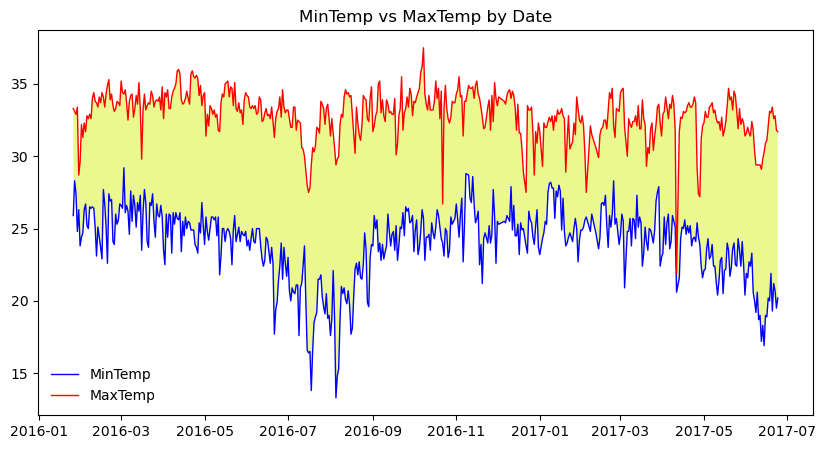

In [48]:
df_date = df.iloc[-500:,:]
plt.figure(figsize=[10,5])
plt.plot(df_date['Date'],df_date['MinTemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(df_date['Date'],df_date['MaxTemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(df_date['Date'],df_date['MinTemp'],df_date['MaxTemp'], facecolor = '#EBF78F')
plt.title('MinTemp vs MaxTemp by Date')
plt.legend(loc='lower left', frameon=False)
plt.show()

# Data Preprocessing for Model

In [49]:
df_model = df.copy()

In [50]:
df_model.isnull().sum()

Date                0
Location            0
MinTemp            57
MaxTemp            29
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir      4204
WindGustSpeed    4181
WindDir9am       2512
WindDir3pm        636
WindSpeed9am      139
WindSpeed3pm      354
Humidity9am       357
Humidity3pm       534
Pressure9am       106
Pressure3pm       112
Cloud9am         6163
Cloud3pm         7679
Temp9am            97
Temp3pm           292
RainToday           0
RainTomorrow        0
Month               0
Day                 0
Year                0
dtype: int64

In [51]:
category = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']
boolean = ['RainTomorrow']

In [52]:
le = preprocessing.LabelEncoder()

# Mengubah data kategori ke data numerik pada DataFrame df
for col in category:
    df_model[col] = le.fit_transform(df_model[col])

# Mengubah data boolean ke data numerik pada DataFrame df
for col in boolean:
    df_model[col] = le.fit_transform(df_model[col])

In [53]:
df_model.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
6049,2009-01-01,6,17.9,35.2,0.0,12.0,12.3,11,48.0,1,...,1004.4,2.0,5.0,26.6,33.4,0,0,1,3,2009
6050,2009-01-02,6,18.4,28.9,0.0,14.8,13.0,8,37.0,10,...,1012.1,1.0,1.0,20.3,27.0,0,0,1,4,2009
6051,2009-01-03,6,15.5,34.1,0.0,12.6,13.3,9,30.0,16,...,1011.6,NaN,1.0,NaN,32.7,0,0,1,5,2009
6052,2009-01-04,6,19.4,37.6,0.0,10.8,10.6,5,46.0,5,...,1009.2,1.0,6.0,28.7,34.9,0,0,1,6,2009
6053,2009-01-05,6,21.9,38.4,0.0,11.4,12.2,14,31.0,14,...,1009.1,1.0,5.0,29.1,35.6,0,0,1,0,2009


### Melakukan Pendekatan dengan menggunakan KNN imputer

KNNImputer menggunakan pendekatan berbasis tetangga terdekat untuk mengestimasi nilai-nilai yang hilang.


In [54]:
from sklearn.impute import KNNImputer

# Membuat objek imputer KNN
imputer = KNNImputer(n_neighbors=5)

# Menggunakan imputer untuk mengisi nilai null
df_model['WindGustSpeed']=imputer.fit_transform(df_model[['WindGustSpeed']])
df_model['WindDir9am']=imputer.fit_transform(df_model[['WindDir9am']])
df_model['WindDir3pm']=imputer.fit_transform(df_model[['WindDir3pm']])
df_model['Humidity9am']=imputer.fit_transform(df_model[['Humidity9am']])
df_model['Humidity3pm']=imputer.fit_transform(df_model[['Humidity3pm']])
df_model['Pressure9am']=imputer.fit_transform(df_model[['Pressure9am']])
df_model['Pressure3pm']=imputer.fit_transform(df_model[['Pressure3pm']])
df_model['Cloud9am']=imputer.fit_transform(df_model[['Cloud9am']])
df_model['Cloud3pm']=imputer.fit_transform(df_model[['Cloud3pm']])
df_model['Temp9am']=imputer.fit_transform(df_model[['Temp9am']])
df_model['Temp3pm']=imputer.fit_transform(df_model[['Temp3pm']])
df_model['Rainfall']=imputer.fit_transform(df_model[['Rainfall']])
df_model['MinTemp']=imputer.fit_transform(df_model[['MinTemp']])
df_model['MaxTemp']=imputer.fit_transform(df_model[['MaxTemp']])
df_model['WindSpeed9am']=imputer.fit_transform(df_model[['WindSpeed9am']])
df_model['WindSpeed3pm']=imputer.fit_transform(df_model[['WindSpeed3pm']])

In [55]:
# Menghitung persentase dari jumlah nilai yang hilang (missing values) pada setiap kolom DataFrame 
df_model.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
Day              0
Year             0
dtype: int64

## Mencari Korelasi

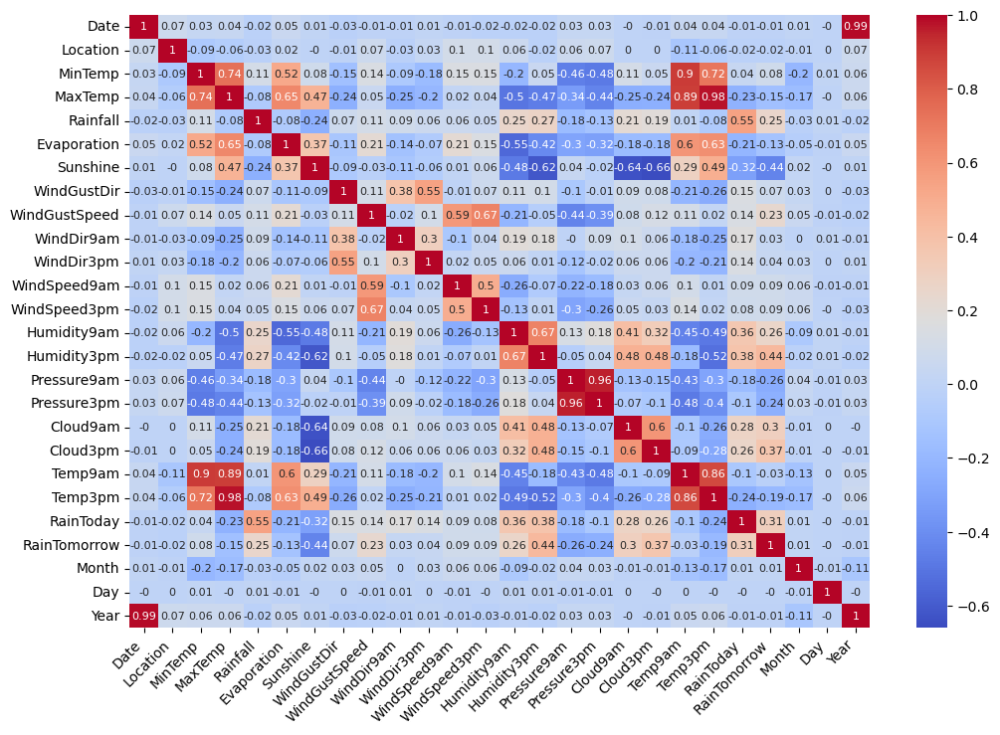

In [56]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_model.corr().round(2), annot=True, cmap='coolwarm', 
            xticklabels=df_model.corr().columns, 
            yticklabels=df_model.corr().columns, 
            annot_kws={"size": 8})
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()

In [57]:
df_model[['Temp3pm','MaxTemp']]

,Temp3pm,MaxTemp
6049,33.4,35.2
6050,27.0,28.9
6051,32.7,34.1
6052,34.9,37.6
6053,35.6,38.4
...,...,...
142298,32.3,33.4
142299,32.0,32.6
142300,32.1,32.8
142301,29.2,31.8


Korelasi 'Temp3pm' dan 'MaxTemp' hampir bernilai 1 (0.98), setelah di analisa sepertinya memang puncak Temp berada di sekitar jam 3pm, sepertinya ini adalah dua dataset yang memang mempunyai nilai terpisah. maka data yang dipakai hanya MaxTemp

## Check Outlier

In [58]:
def check_outlier(df_model):
    Q1 = df_model.quantile(0.25)
    Q3 = df_model.quantile(0.75)

    # Menghitung RUB dan RLB.
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5*IQR
    upper_limit = Q3 + 1.5*IQR

    # Menampilkan banyaknya outlier pada atribut.
    outliers = (df_model < lower_limit) | (df_model > upper_limit)
    print ("Outlier pada tiap atribut:")
    print(outliers.sum())
    print()
    total_data_points = df_model.shape[0]
    percentage_outliers = (outliers.sum() / total_data_points) * 100
    print(f"Persentase outlier dari keseluruhan dataset untuk tiap kolom:")
    print(percentage_outliers)

    return outliers

In [59]:
outliers = dict(check_outlier(df_model).sum())

Outlier pada tiap atribut:
Date                 0
Location             0
MinTemp             12
MaxTemp             22
Rainfall         12526
Evaporation       1587
Sunshine             0
WindGustDir          0
WindGustSpeed     1610
WindDir9am           0
WindDir3pm           0
WindSpeed9am      1291
WindSpeed3pm      1223
Humidity9am        989
Humidity3pm          0
Pressure9am        708
Pressure3pm        576
Cloud9am             0
Cloud3pm             0
Temp9am             12
Temp3pm             60
RainToday        15765
RainTomorrow     15771
Month                0
Day                  0
Year                 0
dtype: int64

Persentase outlier dari keseluruhan dataset untuk tiap kolom:
Date              0.000000
Location          0.000000
MinTemp           0.017094
MaxTemp           0.031339
Rainfall         17.843305
Evaporation       2.260684
Sunshine          0.000000
WindGustDir       0.000000
WindGustSpeed     2.293447
WindDir9am        0.000000
WindDir3pm        0.000000
Wi

Terlihat bahwa terdapat outlier pada kolom numerik Rainfall, Evaporation, dan Sunshine. Dengan demikian, kita dapat menyesuaikan parameter agar menghindari data bergabung dengan outlier

In [60]:
df_model.shape

(70200, 26)

In [61]:
# Pilih kolom-kolom yang akan dijadikan fitur
feature_cols = [
'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir3pm','WindDir9am',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am','RainToday','Month', 'Day'
]

# Pilih kolom target yang akan diprediksi
target_col = ['RainTomorrow']

# Decision Tree Classifier

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [62]:
X = df_model[feature_cols]
y = df_model[target_col]
split_test_size = 0.20

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=100)

### Train Model

In [64]:
from sklearn.tree import DecisionTreeClassifier
Dtc = DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=10)
Dtc = Dtc.fit(X_train, y_train)
y_pred = Dtc.predict(X_test)

### Confusion Matrix

In [65]:
# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8400997150997151
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.94      0.90     10829
           1       0.71      0.51      0.59      3211

    accuracy                           0.84     14040
   macro avg       0.79      0.73      0.75     14040
weighted avg       0.83      0.84      0.83     14040



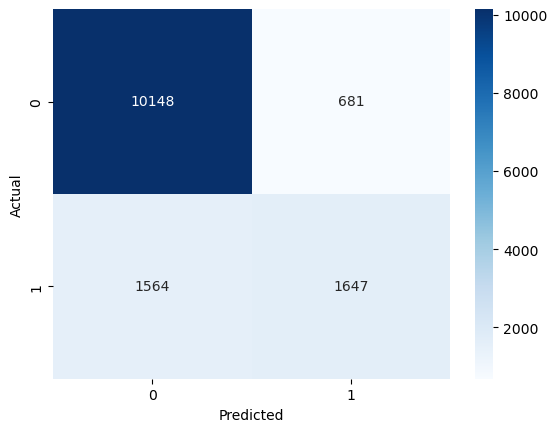

In [66]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = Dtc.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=Dtc.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Dtc.classes_, yticklabels=Dtc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

- True Negatives (TN): 10135
Kasus yang benar-benar diprediksi sebagai negatif.


- False Positives (FP): 1566
Kasus yang salah diprediksi sebagai positif. Model melakukan kesalahan dengan memprediksi sesuatu sebagai positif padahal seharusnya negatif.


- False Negatives (FN): 694
Kasus yang salah diprediksi sebagai negatif. Model melakukan kesalahan dengan memprediksi sesuatu sebagai negatif padahal seharusnya positif.


- True Positives (TP): 1645
Kasus yang benar-benar diprediksi sebagai positif.

## Melihat hasil prediksi di dataframe

In [67]:
# Membuat DataFrame untuk hasil prediksi
result_df = X_test.copy()
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

result_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Actual,Predicted
141830,9,25.5,34.3,0.4,7.2,7.9,7,28.0,14.0,9.0,...,1010.2,1007.2,7.0,5.0,28.3,0,3,2,0,0
72237,13,11.7,23.6,0.0,4.4,9.6,12,37.0,12.0,12.0,...,1019.3,1017.9,1.0,6.0,18.4,0,4,4,0,0
67798,11,17.1,32.8,0.0,8.0,12.1,3,74.0,3.0,3.0,...,1022.0,1018.1,1.0,1.0,23.1,0,2,4,0,0
121855,18,12.5,28.4,0.0,10.4,12.7,0,35.0,2.0,0.0,...,1021.4,1016.4,1.0,0.0,19.7,0,11,2,0,0
21449,16,16.1,23.1,0.0,8.6,13.0,0,35.0,0.0,0.0,...,1018.6,1016.3,1.0,1.0,21.7,0,11,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103460,17,4.0,15.6,0.0,1.0,9.7,5,37.0,7.0,5.0,...,1027.9,1025.2,2.0,6.0,10.2,0,7,2,0,0
86434,3,15.4,19.9,1.4,2.8,9.9,13,46.0,13.0,13.0,...,1017.6,1014.8,2.0,1.0,17.2,1,5,4,0,0
71150,13,15.4,30.8,0.0,9.6,12.9,9,30.0,9.0,9.0,...,1021.0,1018.7,2.0,2.0,19.9,0,1,4,0,0
36476,23,12.0,20.1,16.4,3.8,3.3,6,24.0,9.0,15.0,...,1031.7,1029.3,6.0,7.0,15.5,1,5,3,0,0


In [68]:
result_df['Predicted'].value_counts()

Predicted
0    11712
1     2328
Name: count, dtype: int64

In [69]:
result_true = result_df[result_df['Predicted'] == 1]

In [70]:
result_true.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Actual,Predicted
139368,9,23.4,31.1,19.8,6.2,6.2,4,57.0,5.0,2.0,...,1008.8,1005.7,7.000000,8.00000,25.2,1,3,6,1,1
81557,8,6.8,13.4,10.2,2.4,4.0,12,57.0,15.0,6.0,...,1002.7,1004.2,4.274357,4.34598,8.1,1,7,2,1,1
100033,15,5.2,14.6,4.8,2.0,2.6,13,43.0,13.0,12.0,...,1017.9,1017.0,7.000000,8.00000,11.1,1,5,2,1,1
79935,26,10.7,15.6,0.2,3.2,3.1,3,54.0,3.0,3.0,...,1010.8,1008.5,7.000000,8.00000,11.6,0,7,1,0,1
41392,27,14.1,21.9,7.2,1.8,3.3,2,20.0,0.0,13.0,...,1025.9,1022.2,6.000000,6.00000,18.3,1,4,0,0,1


### Conclusion
Model ini memiliki akurasi sekitar 84%, dan memiliki presisi yang cukup baik untuk mendeteksi hujan:1, dan tidak hujan:2. Akan tetapi jumlah false positif masih banyak

# Random Forrest Classifier

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [71]:
X = df_model[feature_cols]
y = df_model[target_col].values
split_test_size = 0.20

In [72]:
y = y.ravel()

### Train Model

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [74]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100)

In [75]:
rfc = rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

## Evaluasi Model

In [76]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.862037037037037
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.96      0.91     10880
           1       0.78      0.54      0.64      3160

    accuracy                           0.86     14040
   macro avg       0.83      0.75      0.78     14040
weighted avg       0.86      0.86      0.85     14040



## Confusion Matrix

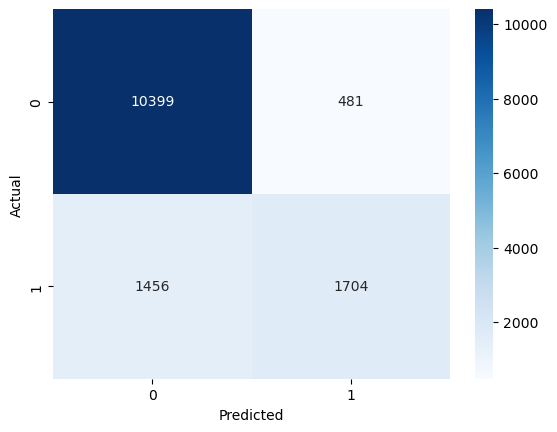

In [77]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = rfc.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=rfc.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=rfc.classes_, yticklabels=rfc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


- **True Negatives (TN):** 10,391
  - Menunjukkan bahwa 10,396 dari sampel yang sebenarnya negatif berhasil diprediksi dengan benar.

- **False Positives (FP):** 1460
  - Mengindikasikan bahwa 484 dari sampel yang sebenarnya negatif salah diprediksi sebagai positif.

- **False Negatives (FN):** 489
  - Menunjukkan bahwa 1,439 dari sampel yang sebenarnya positif salah diprediksi sebagai negatif.

- **True Positives (TP):** 1,700
  - Menunjukkan bahwa 1,721 dari sampel yang sebenarnya positif berhasil diprediksi dengan benar.

In [78]:
# Membuat DataFrame untuk hasil prediksi
result_df = X_test.copy()
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

result_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Actual,Predicted
118547,19,11.0,20.8,1.4,3.8,6.6,3,35.00000,13.0,3.0,...,1016.5,1015.1,7.000000,3.00000,14.2,1,8,6,0,0
108910,1,14.8,29.0,0.0,5.2,4.3,16,40.57591,16.0,16.0,...,1014.2,1009.7,7.000000,5.00000,17.4,0,11,3,0,0
68343,11,8.1,25.4,0.0,3.8,8.8,3,74.00000,3.0,3.0,...,1013.4,1005.2,4.274357,4.34598,16.0,0,9,5,0,0
64663,12,16.2,26.6,0.0,5.4,5.8,3,50.00000,3.0,3.0,...,1025.2,1022.3,7.000000,7.00000,19.5,0,4,6,0,0
37534,25,10.7,25.0,0.0,5.2,10.2,12,56.00000,12.0,15.0,...,1013.5,1010.4,5.000000,2.00000,15.0,0,11,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73102,13,12.8,16.0,0.2,4.4,0.0,5,61.00000,5.0,5.0,...,1014.5,1013.5,8.000000,8.00000,14.4,0,8,1,1,1
33161,22,8.2,18.2,0.0,2.8,9.5,13,37.00000,13.0,13.0,...,1025.5,1023.2,1.000000,1.00000,10.1,0,7,5,0,0
84337,3,13.8,24.1,0.0,2.6,4.0,4,17.00000,3.0,15.0,...,1021.1,1018.0,6.000000,5.00000,16.3,0,5,2,0,0
100276,15,7.6,20.2,0.0,4.0,10.9,11,44.00000,10.0,10.0,...,1019.3,1017.9,7.000000,2.00000,15.6,0,1,0,0,0


In [79]:
result_df['Predicted'].value_counts()

Predicted
0    11855
1     2185
Name: count, dtype: int64

Model ini mampu memprediksi tidak hujan:0 lebih banyak dibandingkan Decission Tree Classifier, memprediksi hujan:1 lebih sedikit dibandingkan Decission Tree Classifier. Tetapi memiliki accuracy dan recall yang lebih baik dibandingkan Decission Tree

## Finding Important Features in Scikit-learn

In [80]:
feature_names = X.columns

In [81]:
feature_imp = pd.Series(rfc.feature_importances_, index=feature_names).sort_values(ascending=False)

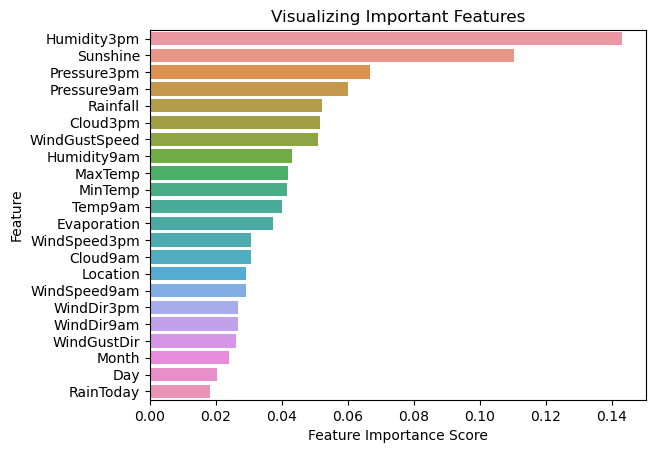

In [82]:
import seaborn as sns
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add Labels to graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.title("Visualizing Important Features")
plt.show()

Dari plot diatas dapat membantu dalam memahami faktor-faktor yang paling berpengaruh dalam membuat prediksi model. Ini dapat memberikan wawasan tentang variabel mana yang memiliki dampak paling besar terhadap hasil prediksi. yang paling berpengaruh di model ini adalah Humidity3pm, Humidity dalam cuaca merujuk pada sejauh mana udara terkandung dengan uap air atau kelembapan.

# Logistic Regression

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [83]:
X = df_model[feature_cols]
y = df_model[target_col].values
split_test_size = 0.20

In [84]:
y = y.ravel()

### Train Model

In [85]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [86]:
print("{0:0.2f}% ada pada training set". format((len(X_train)/len(df_model.index)) * 100))
print("{0:0.2f}% ada pada test set". format((len(X_test)/len(df_model.index)) * 100))

80.00% ada pada training set
20.00% ada pada test set


In [87]:
Lr = LogisticRegression(solver='liblinear', random_state=42)

In [88]:
# Latih model pada data pelatihan
Lr.fit(X_train, y_train)

# Lakukan prediksi pada data pengujian
y_pred = Lr.predict(X_test)

# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8502849002849003
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.94      0.91     10880
           1       0.73      0.53      0.61      3160

    accuracy                           0.85     14040
   macro avg       0.80      0.74      0.76     14040
weighted avg       0.84      0.85      0.84     14040



## Confusion Matrix

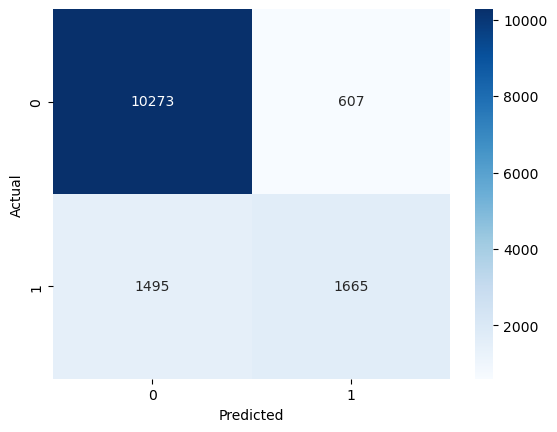

In [89]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = Lr.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=Lr.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Lr.classes_, yticklabels=Lr.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# K-Nearest-Neighbors

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [90]:
X = df_model[feature_cols].values
y = df_model[target_col].values
split_test_size = 0.20

In [91]:
y = y.ravel()

### Train Model

In [92]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [93]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=9)

In [94]:
# Latih model pada data pelatihan
model.fit(X_train,y_train)

# Lakukan prediksi pada data pengujian
y_pred = model.predict(X_test)

# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8494301994301995
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.95      0.91     10880
           1       0.74      0.51      0.61      3160

    accuracy                           0.85     14040
   macro avg       0.80      0.73      0.76     14040
weighted avg       0.84      0.85      0.84     14040



## Confusion Matrix

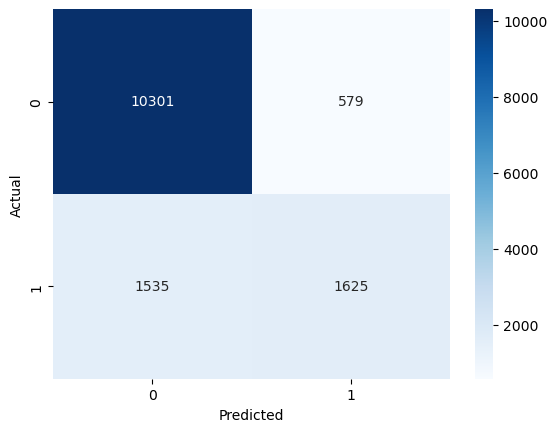

In [95]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = model.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=model.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

- Model KNN menunjukkan kinerja yang baik dengan 10,301 prediksi benar negatif (True Negative) dan 1,625 prediksi benar positif (True Positive) dengan akurasi paling tinggi diantara model lainnya yaitu 85%
- Terdapat 579 prediksi false positif (False Positive), menandakan adanya ketidakakuratan dalam mengidentifikasi kelas positif.
- Sebaliknya, 1,535 prediksi false negatif (False Negative) menunjukkan potensi untuk meningkatkan akurasi pada kelas positif.
- Evaluasi model ini menunjukkan kebutuhan untuk fokus pada peningkatan akurasi pada kelas positif guna mengurangi jumlah false negatives.


## Membuat DataFrame untuk hasil prediksi

In [96]:
# Membuat DataFrame untuk hasil prediksi
result_df = pd.DataFrame(data=X_test.copy())
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

# Menampilkan hasil DataFrame
result_df

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,Actual,Predicted
0,19.0,11.0,20.8,1.4,3.8,6.6,3.0,35.00000,13.0,3.0,...,1016.5,1015.1,7.000000,3.00000,14.2,1.0,8.0,6.0,0,0
1,1.0,14.8,29.0,0.0,5.2,4.3,16.0,40.57591,16.0,16.0,...,1014.2,1009.7,7.000000,5.00000,17.4,0.0,11.0,3.0,0,0
2,11.0,8.1,25.4,0.0,3.8,8.8,3.0,74.00000,3.0,3.0,...,1013.4,1005.2,4.274357,4.34598,16.0,0.0,9.0,5.0,0,0
3,12.0,16.2,26.6,0.0,5.4,5.8,3.0,50.00000,3.0,3.0,...,1025.2,1022.3,7.000000,7.00000,19.5,0.0,4.0,6.0,0,0
4,25.0,10.7,25.0,0.0,5.2,10.2,12.0,56.00000,12.0,15.0,...,1013.5,1010.4,5.000000,2.00000,15.0,0.0,11.0,2.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14035,13.0,12.8,16.0,0.2,4.4,0.0,5.0,61.00000,5.0,5.0,...,1014.5,1013.5,8.000000,8.00000,14.4,0.0,8.0,1.0,1,1
14036,22.0,8.2,18.2,0.0,2.8,9.5,13.0,37.00000,13.0,13.0,...,1025.5,1023.2,1.000000,1.00000,10.1,0.0,7.0,5.0,0,0
14037,3.0,13.8,24.1,0.0,2.6,4.0,4.0,17.00000,3.0,15.0,...,1021.1,1018.0,6.000000,5.00000,16.3,0.0,5.0,2.0,0,0
14038,15.0,7.6,20.2,0.0,4.0,10.9,11.0,44.00000,10.0,10.0,...,1019.3,1017.9,7.000000,2.00000,15.6,0.0,1.0,0.0,0,0


In [97]:
result_df['Predicted'].value_counts()

Predicted
0    11836
1     2204
Name: count, dtype: int64

In [98]:
error = []

In [99]:
for i in range(1,15):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred = knn.predict(X_test)
    error.append(np.mean(pred != y_test))

Text(0, 0.5, 'Error mean')

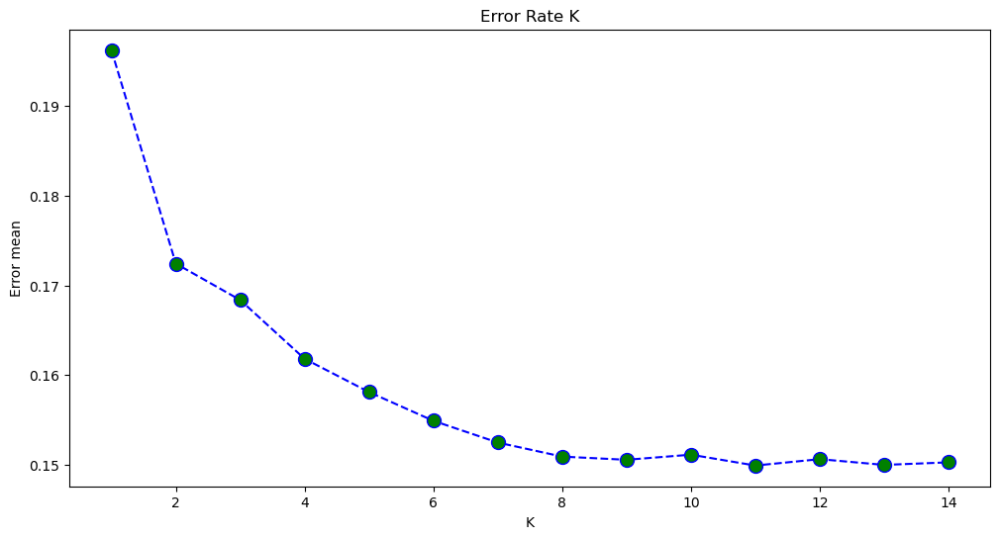

In [100]:
plt.figure(figsize=(12,6))
plt.plot(range(1,15), error, color='blue', linestyle='dashed', marker='o', markerfacecolor='green', markersize=10)
plt.title('Error Rate K')
plt.xlabel('K')
plt.ylabel('Error mean')

## Conclusion KNN 
- **Akurasi (Accuracy):** Model KNN mencapai tingkat akurasi sebesar 0.85, menunjukkan kemampuan model dalam mengklasifikasikan data dengan benar.

- **Precision, Recall, dan F1-Score:**
  - Untuk kelas 0 (Label 0), model memiliki precision sebesar 0.87, recall sebesar 0.95, dan f1-score sebesar 0.91. Hal ini menandakan kemampuan model dalam mengidentifikasi kelas 0 dengan tingkat keakuratan yang tinggi.
  
  - Untuk kelas 1 (Label 1), precision sebesar 0.74, recall sebesar 0.51, dan f1-score sebesar 0.61. Meskipun model cenderung dapat mengklasifikasikan kelas 1 dengan baik (precision), namun recall dan f1-score menunjukkan adanya tantangan dalam mengidentifikasi secara menyeluruh data yang sebenarnya termasuk ke dalam kelas ini.

- **Support:** Data dukungan (support) untuk kelas 0 sebanyak 10,880 dan kelas 1 sebanyak 3,160. Ini menunjukkan distribusi kelas pada data pengujian.

- **Macro dan Weighted Average:**
  - Rata-rata (macro avg) dari precision, recall, dan f1-score adalah 0.80, 0.73, dan 0.76 secara berturut-turut. Ini memberikan gambaran umum tentang kinerja model secara keseluruhan.
  
  - Rata-rata terimbang berdasarkan bobot (weighted avg) dari precision, recall, dan f1-score adalah 0.84, 0.85, dan 0.84 secara berturut-turut. Ini memberikan gambaran kinerja model dengan mempertimbangkan distribusi kelas.


- **Kesimpulan:** Dalam perbandingan dengan model lainnya, model KNN menonjol sebagai model dengan akurasi tertinggi ke 2 setelah random forrest, mencapai tingkat akurasi sekitar 85%. Keunggulan ini dapat memberikan kepercayaan tambahan terhadap kemampuan model dalam mengklasifikasikan data dengan tepat. Namun, walaupun memiliki akurasi yang tinggi, perlu diperhatikan bahwa model ini masih memiliki tantangan dalam mengidentifikasi data pada kelas minoritas, terutama kelas 1, yang ditunjukkan oleh recall yang relatif rendah. Oleh karena itu, untuk pengembangan lebih lanjut, fokus pada peningkatan recall pada kelas 1 dapat menjadi langkah strategis untuk memperbaiki keseimbangan kinerja model ini.



# Support Vector Machine

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [101]:
X = df_model[feature_cols].values
y = df_model[target_col].values
split_test_size = 0.20

In [102]:
y = y.ravel()

## Train Model

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [104]:
from sklearn import svm

model_svm = svm.SVC(kernel='rbf')
model_svm.fit(X_train, y_train)
y_pred = model_svm.predict(X_test)

In [105]:
# Latih model_svm pada data pelatihan
model_svm.fit(X_train,y_train)

# Lakukan prediksi pada data pengujian
y_pred = model_svm.predict(X_test)

# Evaluasi model_svm
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8410968660968661
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.98      0.91     10880
           1       0.83      0.37      0.51      3160

    accuracy                           0.84     14040
   macro avg       0.83      0.68      0.71     14040
weighted avg       0.84      0.84      0.82     14040



## Confusion Matrix

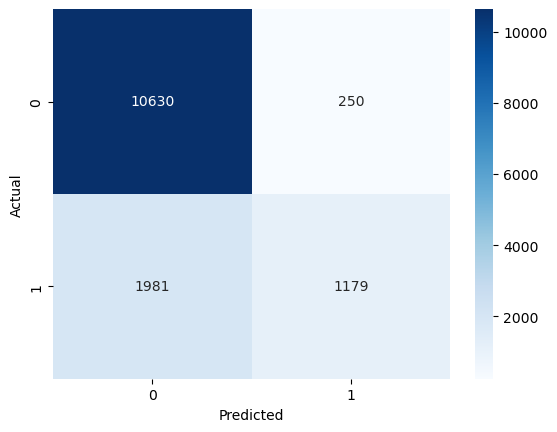

In [106]:
# Prediksi menggunakan model_svm Decision Tree Classifier
predictions = model_svm.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=model_svm.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=model_svm.classes_, yticklabels=model_svm.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Naive Bayes

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [107]:
X = df_model[feature_cols].values
y = df_model[target_col].values
split_test_size = 0.20

In [108]:
y = y.ravel()

## Train Model

In [109]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=45)

In [110]:
Model = GaussianNB()
Model = Model.fit(X_train, y_train)
y_pred = Model.predict(X_test)

## Evaluasi model

In [111]:
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8010683760683761
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.84      0.87     10867
           1       0.55      0.67      0.60      3173

    accuracy                           0.80     14040
   macro avg       0.72      0.75      0.74     14040
weighted avg       0.82      0.80      0.81     14040



## Confusion Matrix

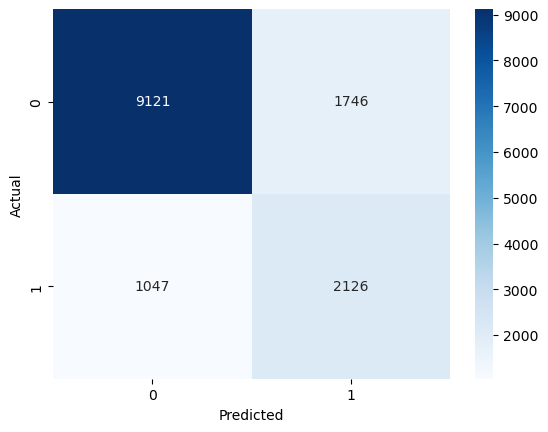

In [112]:
# Prediksi menggunakan Model Decision Tree Classifier
predictions = Model.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=Model.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Model.classes_, yticklabels=Model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [113]:
# Membuat DataFrame untuk hasil prediksi
result_df = pd.DataFrame(data=X_test.copy())
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

# Menampilkan hasil DataFrame
result_df

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,Actual,Predicted
0,8.0,2.5,14.4,0.0,1.4,2.2,3.0,31.00000,3.0,4.0,...,1014.7,1010.6,4.274357,4.34598,9.5,0.0,7.0,3.0,0,1
1,15.0,7.3,14.3,1.4,1.8,3.8,3.0,41.00000,3.0,3.0,...,1012.8,1008.0,6.000000,7.00000,9.2,1.0,7.0,4.0,1,1
2,9.0,25.2,34.5,0.0,7.0,5.2,2.0,37.00000,2.0,9.0,...,1008.5,1005.1,7.000000,7.00000,28.6,0.0,4.0,2.0,0,0
3,26.0,3.4,15.6,0.0,0.6,1.9,12.0,19.00000,8.0,0.0,...,1026.9,1025.7,7.000000,7.00000,7.7,0.0,6.0,0.0,0,1
4,1.0,13.6,24.3,0.0,3.4,5.0,16.0,40.57591,2.0,3.0,...,1015.8,1012.4,6.000000,7.00000,17.7,0.0,5.0,6.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14035,5.0,4.4,26.5,0.0,6.0,12.5,7.0,41.00000,7.0,7.0,...,1028.0,1023.4,0.000000,2.00000,14.9,0.0,10.0,3.0,0,0
14036,13.0,17.9,32.1,0.0,12.6,12.8,13.0,46.00000,13.0,8.0,...,1009.8,1009.3,1.000000,5.00000,25.5,0.0,12.0,1.0,0,0
14037,10.0,15.7,20.6,1.0,6.4,0.0,5.0,24.00000,10.0,7.0,...,1025.2,1022.6,8.000000,8.00000,16.4,0.0,2.0,5.0,1,1
14038,11.0,15.5,22.5,5.0,0.6,3.2,8.0,54.00000,10.0,12.0,...,1011.2,1012.4,7.000000,7.00000,16.2,1.0,1.0,5.0,0,1


In [114]:
result_df['Actual'] = y_test

In [115]:
result_df['Predicted'].value_counts()

Predicted
0    10168
1     3872
Name: count, dtype: int64

In [116]:
result_true = result_df[result_df['Predicted'] == 0]

In [117]:
result_true.head(20)

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,Actual,Predicted
2,9.0,25.2,34.5,0.0,7.0,5.2,2.0,37.00000,2.0,9.0,...,1008.5,1005.1,7.000000,7.00000,28.6,0.0,4.0,2.0,0,0
4,1.0,13.6,24.3,0.0,3.4,5.0,16.0,40.57591,2.0,3.0,...,1015.8,1012.4,6.000000,7.00000,17.7,0.0,5.0,6.0,1,0
5,19.0,9.0,32.6,0.0,8.0,12.2,1.0,39.00000,15.0,5.0,...,1017.0,1013.0,3.000000,4.00000,25.2,0.0,10.0,0.0,0,0
6,22.0,17.4,25.9,1.8,5.4,9.9,16.0,40.57591,4.0,13.0,...,1011.2,1006.3,3.000000,6.00000,19.5,1.0,12.0,1.0,0,0
7,9.0,24.1,34.0,0.0,4.8,11.2,0.0,30.00000,0.0,9.0,...,1011.4,1007.7,4.000000,6.00000,28.2,0.0,4.0,2.0,0,0
8,13.0,3.0,15.8,0.0,1.8,6.6,5.0,28.00000,5.0,4.0,...,1022.2,1018.0,2.000000,7.00000,7.2,0.0,7.0,0.0,0,0
9,4.0,17.6,28.8,0.0,6.2,7.9,2.0,39.00000,2.0,9.0,...,1018.2,1015.0,1.000000,6.00000,22.9,0.0,8.0,1.0,0,0
11,9.0,23.2,31.2,0.0,6.0,10.7,0.0,50.00000,0.0,0.0,...,1014.6,1011.8,3.000000,5.00000,26.0,0.0,5.0,0.0,0,0
12,14.0,19.0,34.9,0.0,13.0,8.0,15.0,61.00000,13.0,3.0,...,1012.1,1008.6,4.000000,7.00000,24.6,0.0,10.0,2.0,0,0
13,24.0,19.4,29.5,0.0,7.0,8.0,0.0,43.00000,0.0,10.0,...,1018.2,1014.9,7.000000,5.00000,25.5,0.0,5.0,2.0,0,0


In [118]:
result_true.tail(20)

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,Actual,Predicted
14007,11.0,20.9,31.9,0.0,8.0,2.2,6.0,41.00000,6.0,3.0,...,1023.1,1019.8,7.000000,7.00000,23.0,0.0,3.0,3.0,0,0
14009,23.0,18.0,29.2,0.0,8.0,13.1,1.0,33.00000,9.0,0.0,...,1015.2,1013.4,3.000000,3.00000,23.0,0.0,12.0,0.0,0,0
14010,17.0,5.2,20.5,0.0,3.4,9.7,6.0,63.00000,6.0,3.0,...,1013.9,1009.6,6.000000,5.00000,14.6,0.0,8.0,3.0,1,0
14011,1.0,10.7,20.8,0.0,2.0,10.3,16.0,40.57591,12.0,8.0,...,1024.3,1019.4,2.000000,0.00000,17.4,0.0,10.0,2.0,0,0
14012,18.0,17.6,22.9,0.0,7.0,5.6,15.0,35.00000,13.0,12.0,...,1012.2,1011.7,7.000000,6.00000,20.1,0.0,10.0,0.0,1,0
14013,4.0,16.2,26.6,0.6,4.4,10.8,10.0,33.00000,2.0,13.0,...,1017.7,1014.4,1.000000,1.00000,21.3,0.0,7.0,1.0,0,0
14019,9.0,19.2,32.8,0.0,6.8,11.0,0.0,33.00000,14.0,0.0,...,1017.3,1013.8,0.000000,0.00000,25.1,0.0,7.0,5.0,0,0
14020,23.0,16.6,21.5,0.0,6.6,2.2,1.0,48.00000,0.0,0.0,...,1038.8,1035.9,7.000000,7.00000,18.6,0.0,10.0,3.0,0,0
14023,0.0,14.2,35.0,0.0,8.0,13.8,2.0,41.00000,12.0,11.0,...,1019.6,1016.6,4.274357,4.34598,23.9,0.0,12.0,1.0,0,0
14025,10.0,11.9,27.4,0.0,5.4,9.8,6.0,56.00000,6.0,6.0,...,1016.4,1013.8,4.274357,4.34598,16.6,0.0,3.0,3.0,0,0


# Overall Analysis

## Conclusion
1. Dataset ini memiliki jumlah null value yang cukup banyak, sehingga memerlukan analisis lebih lanjut untuk menangani null values, sebagian rows dari kolom yang memiliki null values paling banyak adalah RainTomorrow, RainToday, Evaporation, Sunshine. Sehingga dilakukan dropna, atau penghapusan nilai null. dan kolom lainnya diisi dengan KNN imputer.
2. Curah hujan paling tinggi adalah tahun 2010.
3. Wilayah dengan tingkat curah hujan tertinggi adalah portland
4. Korelasi antara MaxTemp dan Temp3pm hampir bernilai 1. Dikarenakan MaxTemp terjadi sekitar pukul 3 sore, sehingga Temp3pm tidak dipilih untuk dijadikan feature model.
5. Terdapat outlier pada kolom numerik Rainfall, Evaporation, dan Sunshine. Dengan demikian, kita dapat menyesuaikan parameter agar kinerja model tetap maximal.
6. Dari semua model yang telah dilakukan training, testing, dan evaluasi. Model yang paling baik kinerja nya adalah Random Forrest Classifier. Dikarenakan memiliki akurasi yang paling tinggi yaitu 86%, dan recall yang cukup untuk mengidentifikasi 1, dan 2, FN dan FP yang sedikit, dan TP dn TN yang paling tinggi.
7. Important features yang paling berpengaruh terhadap kinerja Random Forrest Classifier adalah Humidity3pm. Atau kelembapan cuaca pada pukul 3pm. 
8. Diantara Logistic Regression dan SVM, Logistic Regression menjadi pilihan karena lebih baik dari segi accuracy dan recall 